SUBJECT : PROGRAMMING FOR ANALYTICS BY PROF. GYANESH JAIN


# TOPIC :Collect data for BSE Sensex 30 scripts, for last 10 years and visualize the data with appropriate annotations and texts. Use rolling mean and rolling correlations as well to analyse the data

FROM           : ADVITEEYA SHRAV
ENROLLMENT NO. : MBISDE284

In [3]:
# FOR IMPORTING THE STOCK DATA FROM YAHOO FINANCE WEBSITE
import time
import datetime

# FOR CALCULATION AND DATA MANIPULATION
import pandas as pd
import numpy as np 

# VISUALISATION
import matplotlib.pyplot as plt
%matplotlib inline



In [46]:
# LIST OF 30 STOCKS 

tickers = ['RELIANCE.BO', 'BRITANNIA.BO', 'HDFCBANK.BO', 'INFY.BO', 'ICICIBANK.BO','HINDUNILVR.BO','SBIN.BO', 'BAJFINANCE.BO', 'HDFC.BO','HDFC.BO', 'BHARTIARTL.BO', 'KOTAKBANK.BO','WIPRO.BO', 'HCLTECH.BO', 'ITC.BO','LT.BO','DRREDDY.BO', 'BERGEPAINT.BO', 'ONGC.BO','AXISBANK.BO', 'SUNPHARMA.BO', 'ULTRACEMCO.BO', 'NESTLEIND.BO', 'TATASTEEL.BO','TECHM.BO','POWERGRID.BO', 'PIDILITIND.BO', 'GRASIM.BO', 'CIPLA.BO', 'SIEMENS.BO']

# HERE TIME INTERVAL SELECTED FOR ONE DAY 
interval = '1d'

# START TIME PERIOD
period1 = int(time.mktime(datetime.datetime(2012, 3, 24, 23, 59).timetuple()))

# END TIME PERIOD
period2 = int(time.mktime(datetime.datetime(2022, 3, 23, 23, 59).timetuple()))

# DATA GETTING IMPORTED ONLINE TO EXCEL FROM YAHOO! FINANCE WEBSITE

xlwriter = pd.ExcelWriter('BSE30 Stocks.xlsx', engine='openpyxl')
for ticker in tickers:
    query_string = f'https://query1.finance.yahoo.com/v7/finance/download/{ticker}?period1={period1}&period2={period2}&interval={interval}&events=history&includeAdjustedClose=true'
    df = pd.read_csv(query_string)
    df.to_excel(xlwriter, sheet_name=ticker, index=False)

# DATA IS GETTING SAVED
xlwriter.save()

In [53]:
df = pd.read_excel("BSE30 Stocks.xlsx")
df


,Date,Open,High,Low,Close,Adj Close,Volume
0,2012-03-26,372.450012,372.450012,364.000000,364.899994,337.054962,1524458.0
1,2012-03-27,368.950012,369.850006,362.600006,365.350006,337.470642,2080346.0
2,2012-03-28,365.049988,367.850006,360.549988,362.975006,335.276855,974464.0
3,2012-03-29,360.500000,364.750000,359.700012,362.424988,334.768768,873794.0
4,2012-03-30,365.000000,375.399994,363.500000,374.125000,345.576019,1044672.0
...,...,...,...,...,...,...,...
2462,2022-03-16,2387.949951,2407.050049,2376.449951,2403.250000,2403.250000,276207.0
2463,2022-03-17,2438.000000,2496.899902,2401.149902,2479.649902,2479.649902,286443.0
2464,2022-03-21,2452.000000,2483.699951,2442.000000,2467.149902,2467.149902,207916.0
2465,2022-03-22,2463.699951,2535.000000,2454.000000,2531.100098,2531.100098,304284.0


In [54]:
type(df)

pandas.core.frame.DataFrame

In [55]:
df.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume       float64
dtype: object

In [56]:
df['Close']

0        364.899994
1        365.350006
2        362.975006
3        362.424988
4        374.125000
           ...     
2462    2403.250000
2463    2479.649902
2464    2467.149902
2465    2531.100098
2466    2539.699951
Name: Close, Length: 2467, dtype: float64

In [58]:
# IF YOU HAVE MULTIPLE SHEETS IN THE EXCEL FILE

df1 = pd.ExcelFile("BSE30 Stocks.xlsx")


In [59]:
df1.sheet_names

['RELIANCE.BO',
 'BRITANNIA.BO',
 'HDFCBANK.BO',
 'INFY.BO',
 'ICICIBANK.BO',
 'HINDUNILVR.BO',
 'SBIN.BO',
 'BAJFINANCE.BO',
 'HDFC.BO',
 'BHARTIARTL.BO',
 'KOTAKBANK.BO',
 'WIPRO.BO',
 'HCLTECH.BO',
 'ITC.BO',
 'LT.BO',
 'DRREDDY.BO',
 'BERGEPAINT.BO',
 'ONGC.BO',
 'AXISBANK.BO',
 'SUNPHARMA.BO',
 'ULTRACEMCO.BO',
 'NESTLEIND.BO',
 'TATASTEEL.BO',
 'TECHM.BO',
 'POWERGRID.BO',
 'PIDILITIND.BO',
 'GRASIM.BO',
 'CIPLA.BO',
 'SIEMENS.BO']

In [109]:
# HOW TO READ ALL THE SHEETS IN THE EXCEL FILE

k = []
for i in df1.sheet_names:
    k=pd.read_excel("BSE30 Stocks.xlsx", sheet_name=i)
    print(k)

In [ ]:
# USE OF ROLLING METHODS TO COMPUTER AVERAGES

In [119]:
data['MA_10'] = data.Close.rolling(10).mean()
data['MA_21'] = data.Close.rolling(21).mean()

In [ ]:
# PLOT DATA AND MOVING AVERAGES FOR SINGEL BSE STOCK 

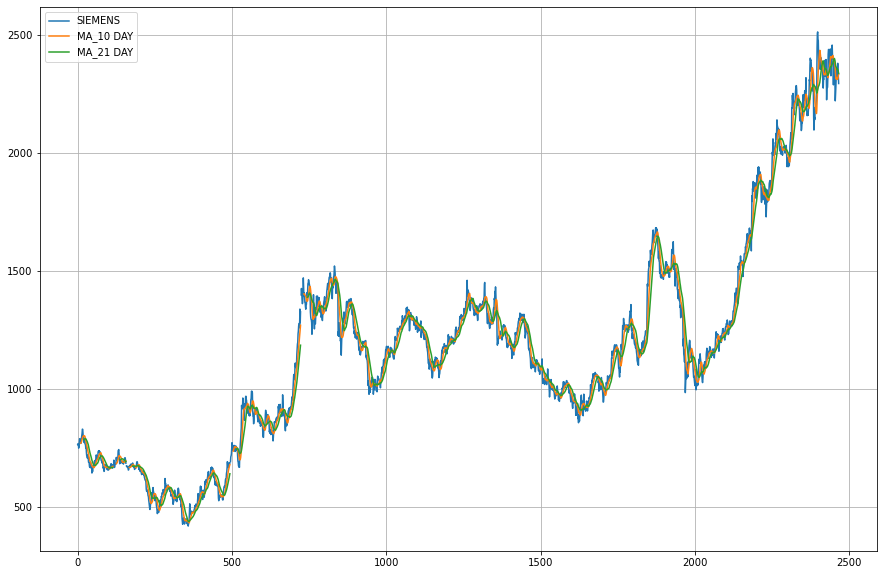

In [120]:
plt.figure(figsize=(15,10))
plt.grid(True)
plt.plot(data['Close'], label= 'SIEMENS')
plt.plot(data['MA_10'], label='MA_10 DAY')
plt.plot(data['MA_21'], label= 'MA_21 DAY')
plt.legend(loc=2)

In [137]:
# HOW TO READ ALL THE SHEETS IN THE EXCEL FILE

k = []
super30 = []
for i in df1.sheet_names:
    k=pd.read_excel("BSE30 Stocks.xlsx", sheet_name=i,index_col= 'Date')
    super30 = pd.DataFrame(k['Close'])
    print(super30)
    

                  Close
Date                   
2012-03-26   364.899994
2012-03-27   365.350006
2012-03-28   362.975006
2012-03-29   362.424988
2012-03-30   374.125000
...                 ...
2022-03-16  2403.250000
2022-03-17  2479.649902
2022-03-21  2467.149902
2022-03-22  2531.100098
2022-03-23  2539.699951

[2467 rows x 1 columns]
                  Close
Date                   
2012-03-26   285.875000
2012-03-27   287.424988
2012-03-28   282.325012
2012-03-29   283.424988
2012-03-30   296.250000
...                 ...
2022-03-16  3312.399902
2022-03-17  3354.250000
2022-03-21  3236.949951
2022-03-22  3157.449951
2022-03-23  3100.300049

[2467 rows x 1 columns]
                  Close
Date                   
2012-03-26   255.274994
2012-03-27   259.024994
2012-03-28   256.649994
2012-03-29   255.350006
2012-03-30   260.024994
...                 ...
2022-03-16  1447.849976
2022-03-17  1480.250000
2022-03-21  1486.050049
2022-03-22  1494.449951
2022-03-23  1475.650024

[2467 rows x 

                  Close
Date                   
2012-03-26   159.850006
2012-03-27   163.100006
2012-03-28   164.949997
2012-03-29   170.649994
2012-03-30   177.550003
...                 ...
2022-03-16  2462.300049
2022-03-17  2510.199951
2022-03-21  2485.199951
2022-03-22  2451.550049
2022-03-23  2429.500000

[2467 rows x 1 columns]
                  Close
Date                   
2012-03-26   441.897552
2012-03-27   437.344238
2012-03-28   431.663025
2012-03-29   437.068542
2012-03-30   439.349365
...                 ...
2022-03-16  1603.500000
2022-03-17  1620.099976
2022-03-21  1570.150024
2022-03-22  1581.500000
2022-03-23  1581.750000

[2467 rows x 1 columns]
                  Close
Date                   
2012-03-26   289.000000
2012-03-27   299.950012
2012-03-28   300.649994
2012-03-29   299.450012
2012-03-30   304.549988
...                 ...
2022-03-16  1055.800049
2022-03-17  1048.400024
2022-03-21  1049.949951
2022-03-22  1032.349976
2022-03-23  1014.900024

[2467 rows x 

In [128]:
df1.sheet_names

['RELIANCE.BO',
 'BRITANNIA.BO',
 'HDFCBANK.BO',
 'INFY.BO',
 'ICICIBANK.BO',
 'HINDUNILVR.BO',
 'SBIN.BO',
 'BAJFINANCE.BO',
 'HDFC.BO',
 'BHARTIARTL.BO',
 'KOTAKBANK.BO',
 'WIPRO.BO',
 'HCLTECH.BO',
 'ITC.BO',
 'LT.BO',
 'DRREDDY.BO',
 'BERGEPAINT.BO',
 'ONGC.BO',
 'AXISBANK.BO',
 'SUNPHARMA.BO',
 'ULTRACEMCO.BO',
 'NESTLEIND.BO',
 'TATASTEEL.BO',
 'TECHM.BO',
 'POWERGRID.BO',
 'PIDILITIND.BO',
 'GRASIM.BO',
 'CIPLA.BO',
 'SIEMENS.BO']

In [138]:
super30

,Close
Date,
2012-03-26,764.849976
2012-03-27,762.799988
2012-03-28,769.200012
2012-03-29,749.650024
2012-03-30,757.700012
...,...
2022-03-16,2357.850098
2022-03-17,2380.699951
2022-03-21,2349.100098


In [165]:
data_reliance = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=0,index_col= 'Date')
dd2=data_reliance.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd2.rename(columns={"Close":"Reliance"})

,Reliance
Date,
2012-03-26,364.899994
2012-03-27,365.350006
2012-03-28,362.975006
2012-03-29,362.424988
2012-03-30,374.125000
...,...
2022-03-16,2403.250000
2022-03-17,2479.649902
2022-03-21,2467.149902


In [164]:
data_britannia = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=1,index_col= 'Date')
dd1= data_britannia.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd1.rename(columns={"Close":"Britannia"})

,Britannia
Date,
2012-03-26,285.875000
2012-03-27,287.424988
2012-03-28,282.325012
2012-03-29,283.424988
2012-03-30,296.250000
...,...
2022-03-16,3312.399902
2022-03-17,3354.250000
2022-03-21,3236.949951


In [177]:
data_data = dd2.merge(dd1,on = 'Date')
data_data

,Close_x,Close_y
Date,,
2012-03-26,364.899994,285.875000
2012-03-27,365.350006,287.424988
2012-03-28,362.975006,282.325012
2012-03-29,362.424988,283.424988
2012-03-30,374.125000,296.250000
...,...,...
2022-03-16,2403.250000,3312.399902
2022-03-17,2479.649902,3354.250000
2022-03-21,2467.149902,3236.949951


In [181]:
data_concat = dd2.rename(columns={"Close":"Reliance"}).join(dd1.rename(columns={"Close":"Britannia"}), on = 'Date')
data_concat

,Reliance,Britannia
Date,,
2012-03-26,364.899994,285.875000
2012-03-27,365.350006,287.424988
2012-03-28,362.975006,282.325012
2012-03-29,362.424988,283.424988
2012-03-30,374.125000,296.250000
...,...,...
2022-03-16,2403.250000,3312.399902
2022-03-17,2479.649902,3354.250000
2022-03-21,2467.149902,3236.949951


In [183]:
data_hdfcbank = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=2,index_col= 'Date')
dd3= data_britannia.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd3.rename(columns={"Close":"HDFCBANK"})

,HDFCBANK
Date,
2012-03-26,285.875000
2012-03-27,287.424988
2012-03-28,282.325012
2012-03-29,283.424988
2012-03-30,296.250000
...,...
2022-03-16,3312.399902
2022-03-17,3354.250000
2022-03-21,3236.949951


In [208]:
data_join1 = data_concat.join(dd3.rename(columns={"Close":"HDFCBANK"}), on= 'Date')
data_join1

,Reliance,Britannia,HDFCBANK
Date,,,
2012-03-26,364.899994,285.875000,285.875000
2012-03-27,365.350006,287.424988,287.424988
2012-03-28,362.975006,282.325012,282.325012
2012-03-29,362.424988,283.424988,283.424988
2012-03-30,374.125000,296.250000,296.250000
...,...,...,...
2022-03-16,2403.250000,3312.399902,3312.399902
2022-03-17,2479.649902,3354.250000,3354.250000
2022-03-21,2467.149902,3236.949951,3236.949951


In [186]:
data_infy = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=3,index_col= 'Date')
dd4= data_infy.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd4.rename(columns={"Close":"INFY"})

,INFY
Date,
2012-03-26,353.931244
2012-03-27,359.418762
2012-03-28,355.193756
2012-03-29,348.875000
2012-03-30,358.118744
...,...
2022-03-16,1888.650024
2022-03-17,1854.400024
2022-03-21,1852.599976


In [209]:
data_join2 = data_join1.join(dd4.rename(columns={"Close":"INFY"}), on='Date')

In [210]:
data_join2


,Reliance,Britannia,HDFCBANK,INFY
Date,,,,
2012-03-26,364.899994,285.875000,285.875000,353.931244
2012-03-27,365.350006,287.424988,287.424988,359.418762
2012-03-28,362.975006,282.325012,282.325012,355.193756
2012-03-29,362.424988,283.424988,283.424988,348.875000
2012-03-30,374.125000,296.250000,296.250000,358.118744
...,...,...,...,...
2022-03-16,2403.250000,3312.399902,3312.399902,1888.650024
2022-03-17,2479.649902,3354.250000,3354.250000,1854.400024
2022-03-21,2467.149902,3236.949951,3236.949951,1852.599976


In [193]:
data_icicibank = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=4,index_col= 'Date')
dd5= data_icicibank.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd5.rename(columns={"Close":"ICICIBANK"})

,ICICIBANK
Date,
2012-03-26,158.518188
2012-03-27,159.272720
2012-03-28,156.199997
2012-03-29,155.645447
2012-03-30,161.318176
...,...
2022-03-16,708.049988
2022-03-17,719.950012
2022-03-21,710.599976


In [211]:
data_join3=data_join2.join(dd5.rename(columns={"Close":"ICICIBANK"}), on = 'Date')

In [196]:
data_hindunilever = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=5,index_col= 'Date')
dd5= data_hindunilever.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd5.rename(columns={"Close":"HINDUNILVR"})

,HINDUNILVR
Date,
2012-03-26,402.299988
2012-03-27,416.049988
2012-03-28,412.299988
2012-03-29,408.399994
2012-03-30,409.899994
...,...
2022-03-16,2069.449951
2022-03-17,2102.100098
2022-03-21,2051.449951


In [213]:
data_join4 = data_join3.join(dd5.rename(columns={"Close":"HINDUNILVR"}), on ='Date')


In [200]:
data_sbin = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=6,index_col= 'Date')
dd6= data_sbin.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd6.rename(columns={"Close":"SBIN"})

,SBIN
Date,
2012-03-26,211.830002
2012-03-27,212.979996
2012-03-28,208.115005
2012-03-29,206.160004
2012-03-30,209.500000
...,...
2022-03-16,492.549988
2022-03-17,501.750000
2022-03-21,490.600006


In [215]:
data_join5 = data_join4.join(dd6.rename(columns={"Close":"SBIN"}),on='Date')

In [202]:
data_bajajfinance = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=7,index_col= 'Date')
dd7= data_bajajfinance.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd7.rename(columns={"Close":"BAJAJFINANCE"})

,BAJAJFINANCE
Date,
2012-03-26,78.703476
2012-03-27,77.994308
2012-03-28,77.450287
2012-03-29,77.197701
2012-03-30,79.232925
...,...
2022-03-16,6840.100098
2022-03-17,6996.850098
2022-03-21,6869.950195


In [217]:
data_join6 = data_join5.join(dd7.rename(columns={"Close":"BAJAJFINANCE"}),on='Date')

In [204]:
data_hdfc = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=8,index_col= 'Date')
dd8= data_hdfc.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd8.rename(columns={"Close":"HDFC"})

,HDFC
Date,
2012-03-26,650.750000
2012-03-27,667.000000
2012-03-28,661.099976
2012-03-29,665.150024
2012-03-30,673.599976
...,...
2022-03-16,2288.300049
2022-03-17,2416.500000
2022-03-21,2391.250000


In [219]:
data_join7 = data_join6.join(dd8.rename(columns={"Close":"HDFC"}), on ='Date')

In [206]:
data_bhartiartl = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=9,index_col= 'Date')
dd9= data_bhartiartl.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd9.rename(columns={"Close":"BHARTIARTL"})

,BHARTIARTL
Date,
2012-03-26,301.012085
2012-03-27,310.054382
2012-03-28,309.411804
2012-03-29,305.877502
2012-03-30,309.136383
...,...
2022-03-16,712.599976
2022-03-17,722.799988
2022-03-21,709.349976


In [221]:
data_join8 = data_join7.join(dd9.rename(columns={"Close":"BHARTIARTL"}),on = 'Date')

In [223]:
data_kotak = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=10,index_col= 'Date')
dd10= data_kotak.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd10.rename(columns={"Close":"KOTAKBANK"})

,KOTAKBANK
Date,
2012-03-26,265.475006
2012-03-27,269.850006
2012-03-28,260.799988
2012-03-29,262.524994
2012-03-30,271.225006
...,...
2022-03-16,1761.349976
2022-03-17,1819.250000
2022-03-21,1775.199951


In [224]:
data_join9 = data_join8.join(dd10.rename(columns={"Close":"KOTAKBANK"}), on = 'Date')

In [226]:
data_wipro = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=11,index_col= 'Date')
dd11= data_wipro.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd11.rename(columns={"Close":"WIPRO"})

,WIPRO
Date,
2012-03-26,158.062546
2012-03-27,160.125046
2012-03-28,161.231293
2012-03-29,163.275040
2012-03-30,164.625046
...,...
2022-03-16,597.900024
2022-03-17,601.299988
2022-03-21,600.150024


In [227]:
data_join10=data_join9.join(dd11.rename(columns={"Close":"WIPRO"}), on = 'Date')

In [229]:
data_hcl = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=12,index_col= 'Date')
dd12= data_hcl.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd12.rename(columns={"Close":"HCLTECH"})

,HCLTECH
Date,
2012-03-26,119.199997
2012-03-27,117.987503
2012-03-28,117.925003
2012-03-29,119.387497
2012-03-30,120.587502
...,...
2022-03-16,1199.300049
2022-03-17,1196.550049
2022-03-21,1168.800049


In [230]:
data_join11=data_join10.join(dd12.rename(columns={"Close":"HCLTECH"}), on = 'Date')

In [232]:
data_itc = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=13,index_col= 'Date')
dd13= data_itc.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd13.rename(columns={"Close":"ITC"})

,ITC
Date,
2012-03-26,148.000000
2012-03-27,150.333328
2012-03-28,151.133331
2012-03-29,149.766663
2012-03-30,151.233337
...,...
2022-03-16,242.600006
2022-03-17,244.850006
2022-03-21,244.399994


In [234]:
data_join12=data_join11.join(dd13.rename(columns={"Close":"ITC"}), on = 'Date')

In [236]:
data_lt = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=14,index_col= 'Date')
dd14= data_lt.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd14.rename(columns={"Close":"LT"})

,LT
Date,
2012-03-26,568.555542
2012-03-27,579.177795
2012-03-28,581.288879
2012-03-29,569.133362
2012-03-30,580.822205
...,...
2022-03-16,1756.449951
2022-03-17,1787.500000
2022-03-21,1756.400024


In [237]:
data_join13 = data_join12.join(dd14.rename(columns={"Close":"LT"}), on = 'Date')

In [239]:
data_drreddy = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=15,index_col= 'Date')
dd15= data_lt.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd15.rename(columns={"Close":"DRREDDY"})

,DRREDDY
Date,
2012-03-26,568.555542
2012-03-27,579.177795
2012-03-28,581.288879
2012-03-29,569.133362
2012-03-30,580.822205
...,...
2022-03-16,1756.449951
2022-03-17,1787.500000
2022-03-21,1756.400024


In [240]:
data_join14 = data_join13.join(dd15.rename(columns={"Close":"DRREDDY"}), on = 'Date')

In [242]:
data_berge = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=16,index_col= 'Date')
dd16= data_berge.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd16.rename(columns={"Close":"BERGEPAINT"})

,BERGEPAINT
Date,
2012-03-26,37.571426
2012-03-27,37.660713
2012-03-28,37.571426
2012-03-29,38.178570
2012-03-30,37.982143
...,...
2022-03-16,705.500000
2022-03-17,718.299988
2022-03-21,693.700012


In [244]:
dj = data_join14.join(dd16.rename(columns={"Close":"BERGEPAINT"}), on = 'Date')

In [246]:
data_ongc = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=17,index_col= 'Date')
dd17= data_berge.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd17.rename(columns={"Close":"ONGC"})

,ONGC
Date,
2012-03-26,37.571426
2012-03-27,37.660713
2012-03-28,37.571426
2012-03-29,38.178570
2012-03-30,37.982143
...,...
2022-03-16,705.500000
2022-03-17,718.299988
2022-03-21,693.700012


In [247]:
dj1 = dj.join(dd17.rename(columns={"Close":"ONGC"}), on = 'Date')


In [249]:
data_axis = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=18,index_col= 'Date')
dd18= data_axis.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd18.rename(columns={"Close":"AXIS"})

,AXIS
Date,
2012-03-26,225.250000
2012-03-27,228.210007
2012-03-28,223.429993
2012-03-29,224.520004
2012-03-30,229.179993
...,...
2022-03-16,723.700012
2022-03-17,739.400024
2022-03-21,726.400024


In [250]:
dj2 = dj1.join(dd18.rename(columns={"Close":"AXIS"}), on = 'Date')

In [252]:
data_sunp = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=19,index_col= 'Date')
dd19= data_sunp.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd19.rename(columns={"Close":"SUNPHARMA"})

,SUNPHARMA
Date,
2012-03-26,288.000000
2012-03-27,287.674988
2012-03-28,284.350006
2012-03-29,285.399994
2012-03-30,284.750000
...,...
2022-03-16,888.799988
2022-03-17,910.750000
2022-03-21,914.450012


In [253]:
dj3 = dj2.join(dd19.rename(columns={"Close":"SUNPHARMA"}), on = 'Date')

In [255]:
data_ultra = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=20,index_col= 'Date')
dd20= data_ultra.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd20.rename(columns={"Close":"ULTRACEMENT"})

,ULTRACEMENT
Date,
2012-03-26,1487.949951
2012-03-27,1490.650024
2012-03-28,1482.250000
2012-03-29,1492.300049
2012-03-30,1506.949951
...,...
2022-03-16,6303.549805
2022-03-17,6373.000000
2022-03-21,6193.850098


In [257]:
dj4 = dj3.join(dd20.rename(columns={"Close":"ULTRACEMENT"}),on= 'Date')

In [259]:
data_nestle = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=21,index_col= 'Date')
dd21= data_nestle.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd21.rename(columns={"Close":"NESTLEIND"})

,NESTLEIND
Date,
2012-03-26,4447.100098
2012-03-27,4474.850098
2012-03-28,4503.399902
2012-03-29,4474.100098
2012-03-30,4602.850098
...,...
2022-03-16,17804.000000
2022-03-17,18269.400391
2022-03-21,17859.550781


In [260]:
dj5 = dj4.join(dd21.rename(columns={"Close":"NESTLEIND"}), on = "Date")

In [262]:
data_tatasteel = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=22,index_col= 'Date')
dd22= data_tatasteel.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd22.rename(columns={"Close":"TATASTEEL"})

,TATASTEEL
Date,
2012-03-26,419.648438
2012-03-27,425.412720
2012-03-28,433.987671
2012-03-29,430.795868
2012-03-30,448.183960
...,...
2022-03-16,1265.199951
2022-03-17,1303.349976
2022-03-21,1302.250000


In [263]:
dj6 = dj5.join(dd22.rename(columns={"Close":"TATASTEEL"}), on = 'Date')

In [265]:
data_techm = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=23,index_col= 'Date')
dd23= data_techm.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd23.rename(columns={"Close":"TECHMAHINDRA"})

,TECHMAHINDRA
Date,
2012-03-26,179.337494
2012-03-27,175.687500
2012-03-28,175.637497
2012-03-29,177.687500
2012-03-30,179.912506
...,...
2022-03-16,1489.500000
2022-03-17,1491.900024
2022-03-21,1481.650024


In [266]:
dj7 = dj6.join(dd23.rename(columns={"Close":"TECHMAHINDRA"}), on = 'Date')

In [268]:
data_powergrid = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=24,index_col= 'Date')
dd24= data_powergrid.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd24.rename(columns={"Close":"POWERGRID"})

,POWERGRID
Date,
2012-03-26,105.949997
2012-03-27,105.650002
2012-03-28,106.199997
2012-03-29,105.900002
2012-03-30,107.900002
...,...
2022-03-16,209.300003
2022-03-17,211.500000
2022-03-21,204.899994


In [269]:
dj8 = dj7.join(dd24.rename(columns={"Close":"POWERGRID"}), on = 'Date')

In [271]:
data_pidilite = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=25,index_col= 'Date')
dd25= data_pidilite.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd25.rename(columns={"Close":"PIDILITE"})

,PIDILITE
Date,
2012-03-26,159.850006
2012-03-27,163.100006
2012-03-28,164.949997
2012-03-29,170.649994
2012-03-30,177.550003
...,...
2022-03-16,2462.300049
2022-03-17,2510.199951
2022-03-21,2485.199951


In [272]:
dj9 = dj8.join(dd25.rename(columns={"Close":"PIDILITE"}), on = 'Date')

In [274]:
data_grasim = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=26,index_col= 'Date')
dd26= data_grasim.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd26.rename(columns={"Close":"GRASIM"})

,GRASIM
Date,
2012-03-26,441.897552
2012-03-27,437.344238
2012-03-28,431.663025
2012-03-29,437.068542
2012-03-30,439.349365
...,...
2022-03-16,1603.500000
2022-03-17,1620.099976
2022-03-21,1570.150024


In [275]:
dj10 = dj9.join(dd26.rename(columns={"Close":"GRASIM"}), on = 'Date')

In [277]:
data_cipla = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=27,index_col= 'Date')
dd27= data_cipla.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd27.rename(columns={"Close":"CIPLA"})

,CIPLA
Date,
2012-03-26,289.000000
2012-03-27,299.950012
2012-03-28,300.649994
2012-03-29,299.450012
2012-03-30,304.549988
...,...
2022-03-16,1055.800049
2022-03-17,1048.400024
2022-03-21,1049.949951


In [278]:
dj11 = dj10.join(dd27.rename(columns={"Close":"CIPLA"}), on = 'Date')

In [279]:
dj11

,Reliance,Britannia,HDFCBANK,INFY,ICICIBANK,HINDUNILVR,SBIN,BAJAJFINANCE,HDFC,BHARTIARTL,...,AXIS,SUNPHARMA,ULTRACEMENT,NESTLEIND,TATASTEEL,TECHMAHINDRA,POWERGRID,PIDILITE,GRASIM,CIPLA
Date,,,,,,,,,,,,,,,,,,,,,
2012-03-26,364.899994,285.875000,285.875000,353.931244,402.299988,402.299988,211.830002,78.703476,650.750000,301.012085,...,225.250000,288.000000,1487.949951,4447.100098,419.648438,179.337494,105.949997,159.850006,441.897552,289.000000
2012-03-27,365.350006,287.424988,287.424988,359.418762,416.049988,416.049988,212.979996,77.994308,667.000000,310.054382,...,228.210007,287.674988,1490.650024,4474.850098,425.412720,175.687500,105.650002,163.100006,437.344238,299.950012
2012-03-28,362.975006,282.325012,282.325012,355.193756,412.299988,412.299988,208.115005,77.450287,661.099976,309.411804,...,223.429993,284.350006,1482.250000,4503.399902,433.987671,175.637497,106.199997,164.949997,431.663025,300.649994
2012-03-29,362.424988,283.424988,283.424988,348.875000,408.399994,408.399994,206.160004,77.197701,665.150024,305.877502,...,224.520004,285.399994,1492.300049,4474.100098,430.795868,177.687500,105.900002,170.649994,437.068542,299.450012
2012-03-30,374.125000,296.250000,296.250000,358.118744,409.899994,409.899994,209.500000,79.232925,673.599976,309.136383,...,229.179993,284.750000,1506.949951,4602.850098,448.183960,179.912506,107.900002,177.550003,439.349365,304.549988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-16,2403.250000,3312.399902,3312.399902,1888.650024,2069.449951,2069.449951,492.549988,6840.100098,2288.300049,712.599976,...,723.700012,888.799988,6303.549805,17804.000000,1265.199951,1489.500000,209.300003,2462.300049,1603.500000,1055.800049
2022-03-17,2479.649902,3354.250000,3354.250000,1854.400024,2102.100098,2102.100098,501.750000,6996.850098,2416.500000,722.799988,...,739.400024,910.750000,6373.000000,18269.400391,1303.349976,1491.900024,211.500000,2510.199951,1620.099976,1048.400024
2022-03-21,2467.149902,3236.949951,3236.949951,1852.599976,2051.449951,2051.449951,490.600006,6869.950195,2391.250000,709.349976,...,726.400024,914.450012,6193.850098,17859.550781,1302.250000,1481.650024,204.899994,2485.199951,1570.150024,1049.949951


In [280]:
data_siemens = pd.read_excel("BSE30 Stocks.xlsx", sheet_name=28,index_col= 'Date')
dd28= data_siemens.drop(["Open","High","Low","Adj Close", "Volume"], axis=1)
dd28.rename(columns={"Close":"SIEMENS"})

,SIEMENS
Date,
2012-03-26,764.849976
2012-03-27,762.799988
2012-03-28,769.200012
2012-03-29,749.650024
2012-03-30,757.700012
...,...
2022-03-16,2357.850098
2022-03-17,2380.699951
2022-03-21,2349.100098


In [282]:
BSE= dj11.join(dd28.rename(columns={"Close":"SIEMENS"}), on = 'Date')

In [283]:
BSE

,Reliance,Britannia,HDFCBANK,INFY,ICICIBANK,HINDUNILVR,SBIN,BAJAJFINANCE,HDFC,BHARTIARTL,...,SUNPHARMA,ULTRACEMENT,NESTLEIND,TATASTEEL,TECHMAHINDRA,POWERGRID,PIDILITE,GRASIM,CIPLA,SIEMENS
Date,,,,,,,,,,,,,,,,,,,,,
2012-03-26,364.899994,285.875000,285.875000,353.931244,402.299988,402.299988,211.830002,78.703476,650.750000,301.012085,...,288.000000,1487.949951,4447.100098,419.648438,179.337494,105.949997,159.850006,441.897552,289.000000,764.849976
2012-03-27,365.350006,287.424988,287.424988,359.418762,416.049988,416.049988,212.979996,77.994308,667.000000,310.054382,...,287.674988,1490.650024,4474.850098,425.412720,175.687500,105.650002,163.100006,437.344238,299.950012,762.799988
2012-03-28,362.975006,282.325012,282.325012,355.193756,412.299988,412.299988,208.115005,77.450287,661.099976,309.411804,...,284.350006,1482.250000,4503.399902,433.987671,175.637497,106.199997,164.949997,431.663025,300.649994,769.200012
2012-03-29,362.424988,283.424988,283.424988,348.875000,408.399994,408.399994,206.160004,77.197701,665.150024,305.877502,...,285.399994,1492.300049,4474.100098,430.795868,177.687500,105.900002,170.649994,437.068542,299.450012,749.650024
2012-03-30,374.125000,296.250000,296.250000,358.118744,409.899994,409.899994,209.500000,79.232925,673.599976,309.136383,...,284.750000,1506.949951,4602.850098,448.183960,179.912506,107.900002,177.550003,439.349365,304.549988,757.700012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-16,2403.250000,3312.399902,3312.399902,1888.650024,2069.449951,2069.449951,492.549988,6840.100098,2288.300049,712.599976,...,888.799988,6303.549805,17804.000000,1265.199951,1489.500000,209.300003,2462.300049,1603.500000,1055.800049,2357.850098
2022-03-17,2479.649902,3354.250000,3354.250000,1854.400024,2102.100098,2102.100098,501.750000,6996.850098,2416.500000,722.799988,...,910.750000,6373.000000,18269.400391,1303.349976,1491.900024,211.500000,2510.199951,1620.099976,1048.400024,2380.699951
2022-03-21,2467.149902,3236.949951,3236.949951,1852.599976,2051.449951,2051.449951,490.600006,6869.950195,2391.250000,709.349976,...,914.450012,6193.850098,17859.550781,1302.250000,1481.650024,204.899994,2485.199951,1570.150024,1049.949951,2349.100098


In [ ]:
BSE.to_excel('BSE Close Value Data of 10 Years.xlsx')

In [ ]:
plt.plot(BSE)

In [4]:
BSE = pd.read_excel("BSE Close Value Data of 10 Years.xlsx" , index_col= 'Date' , parse_dates= True)

In [5]:
BSE1 = pd.DataFrame(BSE)

In [6]:
BSE1

,Reliance,Britannia,HDFCBANK,INFY,ICICIBANK,HINDUNILVR,SBIN,BAJAJFINANCE,HDFC,BHARTIARTL,...,SUNPHARMA,ULTRACEMENT,NESTLEIND,TATASTEEL,TECHMAHINDRA,POWERGRID,PIDILITE,GRASIM,CIPLA,SIEMENS
Date,,,,,,,,,,,,,,,,,,,,,
2012-03-26,364.899994,285.875000,285.875000,353.931244,402.299988,402.299988,211.830002,78.703476,650.750000,301.012085,...,288.000000,1487.949951,4447.100098,419.648438,179.337494,105.949997,159.850006,441.897552,289.000000,764.849976
2012-03-27,365.350006,287.424988,287.424988,359.418762,416.049988,416.049988,212.979996,77.994308,667.000000,310.054382,...,287.674988,1490.650024,4474.850098,425.412720,175.687500,105.650002,163.100006,437.344238,299.950012,762.799988
2012-03-28,362.975006,282.325012,282.325012,355.193756,412.299988,412.299988,208.115005,77.450287,661.099976,309.411804,...,284.350006,1482.250000,4503.399902,433.987671,175.637497,106.199997,164.949997,431.663025,300.649994,769.200012
2012-03-29,362.424988,283.424988,283.424988,348.875000,408.399994,408.399994,206.160004,77.197701,665.150024,305.877502,...,285.399994,1492.300049,4474.100098,430.795868,177.687500,105.900002,170.649994,437.068542,299.450012,749.650024
2012-03-30,374.125000,296.250000,296.250000,358.118744,409.899994,409.899994,209.500000,79.232925,673.599976,309.136383,...,284.750000,1506.949951,4602.850098,448.183960,179.912506,107.900002,177.550003,439.349365,304.549988,757.700012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-16,2403.250000,3312.399902,3312.399902,1888.650024,2069.449951,2069.449951,492.549988,6840.100098,2288.300049,712.599976,...,888.799988,6303.549805,17804.000000,1265.199951,1489.500000,209.300003,2462.300049,1603.500000,1055.800049,2357.850098
2022-03-17,2479.649902,3354.250000,3354.250000,1854.400024,2102.100098,2102.100098,501.750000,6996.850098,2416.500000,722.799988,...,910.750000,6373.000000,18269.400391,1303.349976,1491.900024,211.500000,2510.199951,1620.099976,1048.400024,2380.699951
2022-03-21,2467.149902,3236.949951,3236.949951,1852.599976,2051.449951,2051.449951,490.600006,6869.950195,2391.250000,709.349976,...,914.450012,6193.850098,17859.550781,1302.250000,1481.650024,204.899994,2485.199951,1570.150024,1049.949951,2349.100098


In [7]:
# FOR DATA VISUALIZATION 
import seaborn as sns
import plotly as py
import cufflinks as cf
import plotly.tools as tls
import matplotlib.pyplot as plt

from plotly.offline import iplot
from plotly.offline import iplot
%matplotlib inline

py.offline.init_notebook_mode(connected= True)
cf.go_offline()

In [8]:
BSE1.iplot()

In [12]:
BSE1.iplot(kind = 'box', xTitle= 'BSE SCRIPTS' , yTitle = 'Price')

In [13]:
BSE1.describe()

,Reliance,Britannia,HDFCBANK,INFY,ICICIBANK,HINDUNILVR,SBIN,BAJAJFINANCE,HDFC,BHARTIARTL,...,SUNPHARMA,ULTRACEMENT,NESTLEIND,TATASTEEL,TECHMAHINDRA,POWERGRID,PIDILITE,GRASIM,CIPLA,SIEMENS
count,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,...,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000
mean,977.197690,1943.364170,1943.364170,679.772624,1289.741271,1289.741271,270.086459,2012.884771,1557.838895,380.932194,...,605.185880,3665.951541,9390.386144,499.806282,619.111125,163.969189,918.487779,805.134869,578.895290,1177.108099
std,655.103412,1227.200389,1227.200389,385.380585,677.227739,677.227739,79.118512,2092.801708,613.854579,118.059349,...,178.542875,1552.691258,4896.061259,268.220086,313.057142,38.993563,624.864959,341.980097,164.853091,447.849483
min,338.100006,226.600006,226.600006,265.625000,399.549988,399.549988,147.339996,77.197701,621.099976,222.431320,...,279.325012,1363.349976,4328.399902,189.220520,152.037506,91.050003,159.550003,362.845245,289.000000,419.399994
25%,451.900009,679.100006,679.100006,459.246872,736.450012,736.450012,214.559998,259.482498,1055.074951,298.120391,...,466.399994,2584.574951,5537.174805,341.659393,445.493744,132.300003,394.150009,562.217987,440.650009,888.100006
50%,651.450012,1712.224976,1712.224976,550.487488,934.700012,934.700012,259.765015,1181.900024,1474.800049,336.538696,...,580.099976,3718.300049,6831.950195,413.217224,544.750000,175.649994,724.299988,717.085144,566.099976,1161.250000
75%,1330.792175,3097.099976,3097.099976,732.549988,1928.049988,1928.049988,301.149994,3231.699951,1970.775024,434.672074,...,768.674988,4204.774902,13507.875000,555.474976,726.950012,196.750000,1323.825012,973.762848,648.500000,1343.924988
max,2731.500000,4122.049805,4122.049805,1939.349976,2812.050049,2812.050049,540.450012,7927.700195,3000.649902,764.950012,...,1168.500000,8212.549805,20439.449219,1519.150024,1806.250000,248.699997,2748.550049,1916.800049,1069.750000,2513.600098


In [17]:
BSE1

,Reliance,Britannia,HDFCBANK,INFY,ICICIBANK,HINDUNILVR,SBIN,BAJAJFINANCE,HDFC,BHARTIARTL,...,SUNPHARMA,ULTRACEMENT,NESTLEIND,TATASTEEL,TECHMAHINDRA,POWERGRID,PIDILITE,GRASIM,CIPLA,SIEMENS
Date,,,,,,,,,,,,,,,,,,,,,
2012-03-26,364.899994,285.875000,285.875000,353.931244,402.299988,402.299988,211.830002,78.703476,650.750000,301.012085,...,288.000000,1487.949951,4447.100098,419.648438,179.337494,105.949997,159.850006,441.897552,289.000000,764.849976
2012-03-27,365.350006,287.424988,287.424988,359.418762,416.049988,416.049988,212.979996,77.994308,667.000000,310.054382,...,287.674988,1490.650024,4474.850098,425.412720,175.687500,105.650002,163.100006,437.344238,299.950012,762.799988
2012-03-28,362.975006,282.325012,282.325012,355.193756,412.299988,412.299988,208.115005,77.450287,661.099976,309.411804,...,284.350006,1482.250000,4503.399902,433.987671,175.637497,106.199997,164.949997,431.663025,300.649994,769.200012
2012-03-29,362.424988,283.424988,283.424988,348.875000,408.399994,408.399994,206.160004,77.197701,665.150024,305.877502,...,285.399994,1492.300049,4474.100098,430.795868,177.687500,105.900002,170.649994,437.068542,299.450012,749.650024
2012-03-30,374.125000,296.250000,296.250000,358.118744,409.899994,409.899994,209.500000,79.232925,673.599976,309.136383,...,284.750000,1506.949951,4602.850098,448.183960,179.912506,107.900002,177.550003,439.349365,304.549988,757.700012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-16,2403.250000,3312.399902,3312.399902,1888.650024,2069.449951,2069.449951,492.549988,6840.100098,2288.300049,712.599976,...,888.799988,6303.549805,17804.000000,1265.199951,1489.500000,209.300003,2462.300049,1603.500000,1055.800049,2357.850098
2022-03-17,2479.649902,3354.250000,3354.250000,1854.400024,2102.100098,2102.100098,501.750000,6996.850098,2416.500000,722.799988,...,910.750000,6373.000000,18269.400391,1303.349976,1491.900024,211.500000,2510.199951,1620.099976,1048.400024,2380.699951
2022-03-21,2467.149902,3236.949951,3236.949951,1852.599976,2051.449951,2051.449951,490.600006,6869.950195,2391.250000,709.349976,...,914.450012,6193.850098,17859.550781,1302.250000,1481.650024,204.899994,2485.199951,1570.150024,1049.949951,2349.100098


In [18]:
import plotly.express as px

In [26]:
fig = px.scatter(BSE1)
fig.show()

In [ ]:
# ROLLING MEANOF THE DATA 

In [41]:
data_reliance = []
data_reliance = pd.DataFrame(data_reliance)
data_reliance['MA_10'] = BSE1.Reliance.rolling(10).mean()
data_reliance['MA_20'] = BSE1.Reliance.rolling(20).mean()
data_reliance['MA_30'] = BSE1.Reliance.rolling(30).mean()
data_reliance['MC_10'] = BSE1.Reliance.rolling(10).corr()
data_reliance['MC_20'] = BSE1.Reliance.rolling(20).corr()
data_reliance['MC_30'] = BSE1.Reliance.rolling(30).corr()


In [ ]:
# FOR SINGLE STOCK ROLLING MEAN AND ROLLING CORRELATION 

In [42]:
data_reliance

,MA_10,MA_20,MA_30,MC_10,MC_20,MC_30
Date,,,,,,
2012-03-26,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-27,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-28,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-29,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-30,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
2022-03-16,2351.100000,2362.579993,2362.960002,1.0,1.0,1.0
2022-03-17,2361.244995,2365.944983,2366.164998,1.0,1.0,1.0
2022-03-21,2375.424975,2367.057483,2369.979997,1.0,1.0,1.0


In [44]:
data_reliance.iplot(xTitle = 'Years', yTitle='Reliance Price over 10 years')

In [50]:
BSE1.describe().iplot()

In [51]:
BSE1.describe().iplot(kind = 'bar')

In [52]:
BSE1.columns

Index(['Reliance', 'Britannia', 'HDFCBANK', 'INFY', 'ICICIBANK', 'HINDUNILVR',
       'SBIN', 'BAJAJFINANCE', 'HDFC', 'BHARTIARTL', 'KOTAKBANK', 'WIPRO',
       'HCLTECH', 'ITC', 'LT', 'DRREDDY', 'BERGEPAINT', 'ONGC', 'AXIS',
       'SUNPHARMA', 'ULTRACEMENT', 'NESTLEIND', 'TATASTEEL', 'TECHMAHINDRA',
       'POWERGRID', 'PIDILITE', 'GRASIM', 'CIPLA', 'SIEMENS'],
      dtype='object')

In [ ]:
MA = []
MA = pd.DataFrame(MA)

for i in range(len(BSE1.columns)):
    MA[i] = BSE1[BSE1.columns[i]].rolling(10).mean()
    MA[i] = BSE1[BSE1.columns[i]].rolling(20).mean()
    print("Rolling Mean (20) for BSE scrap :" , BSE1.columns[i])
    print(MA[i])
    MA[i].iplot()

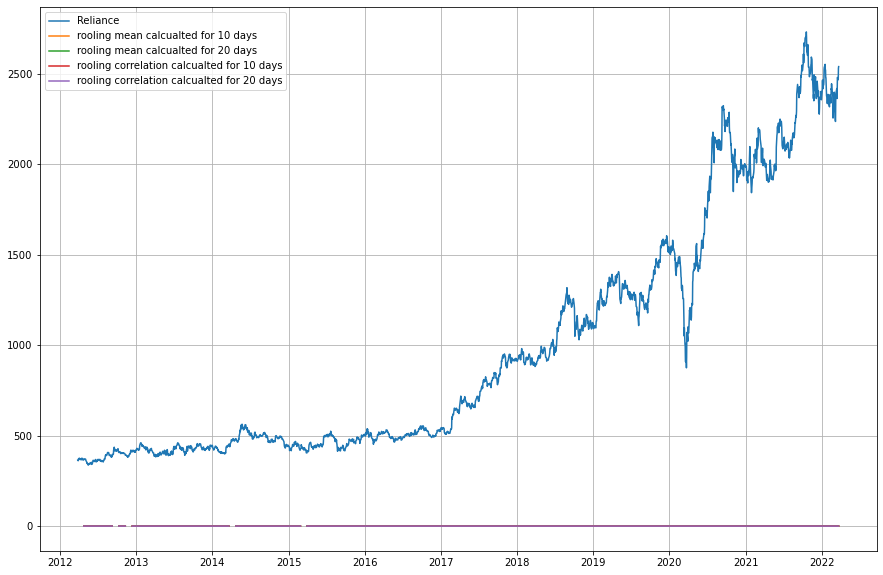

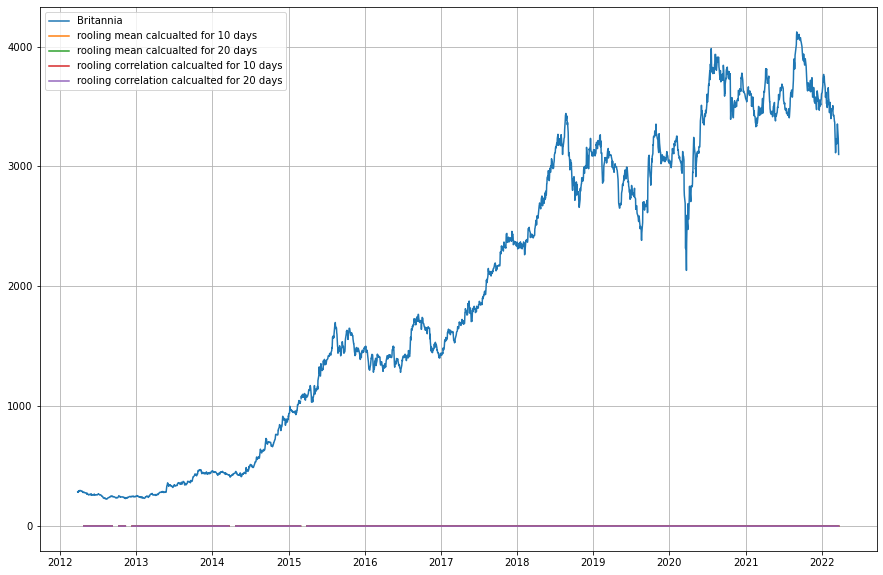

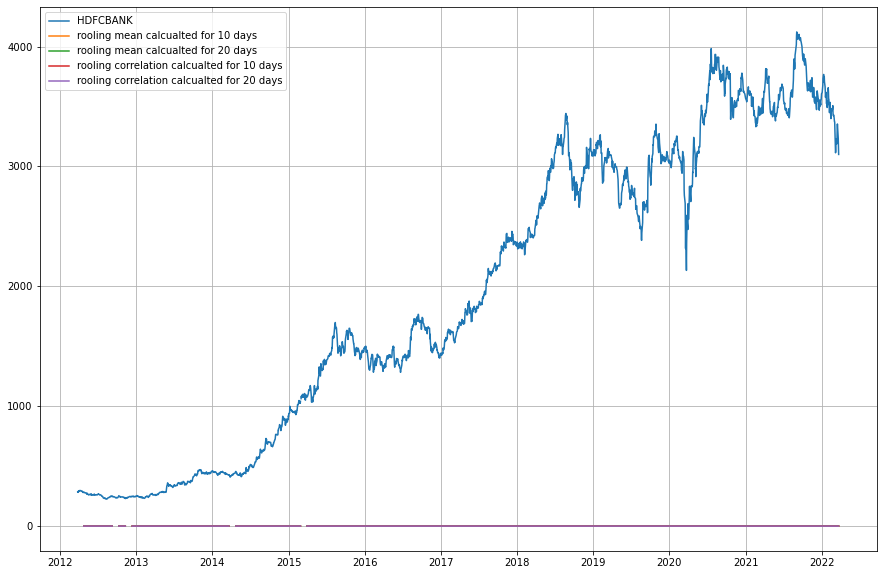

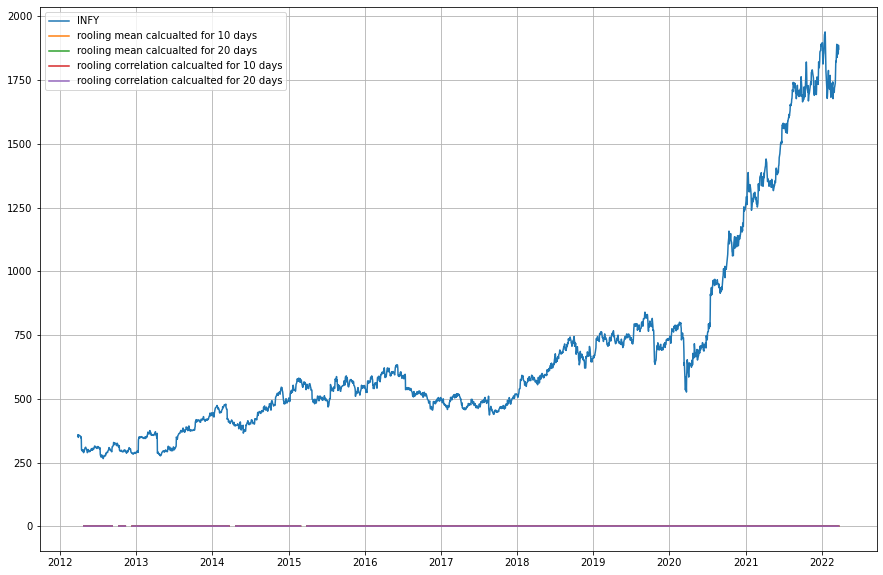

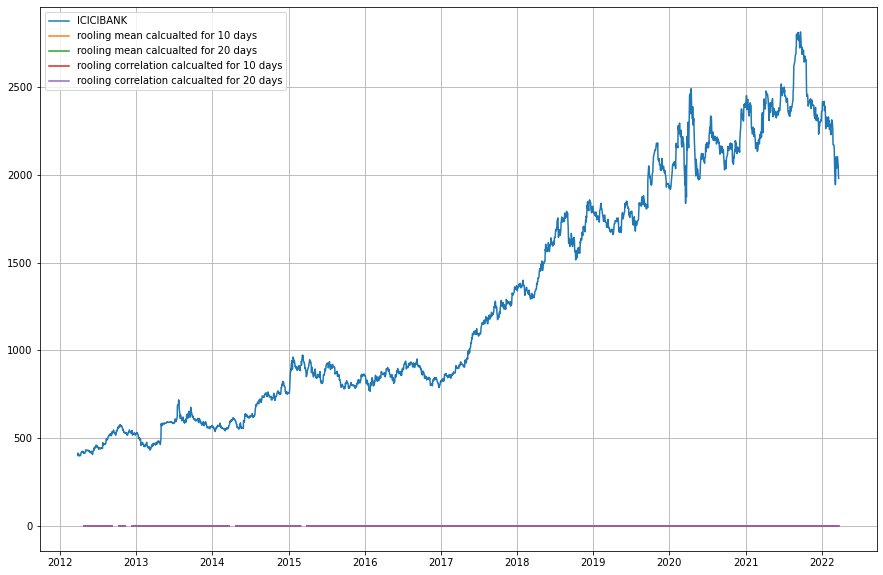

...

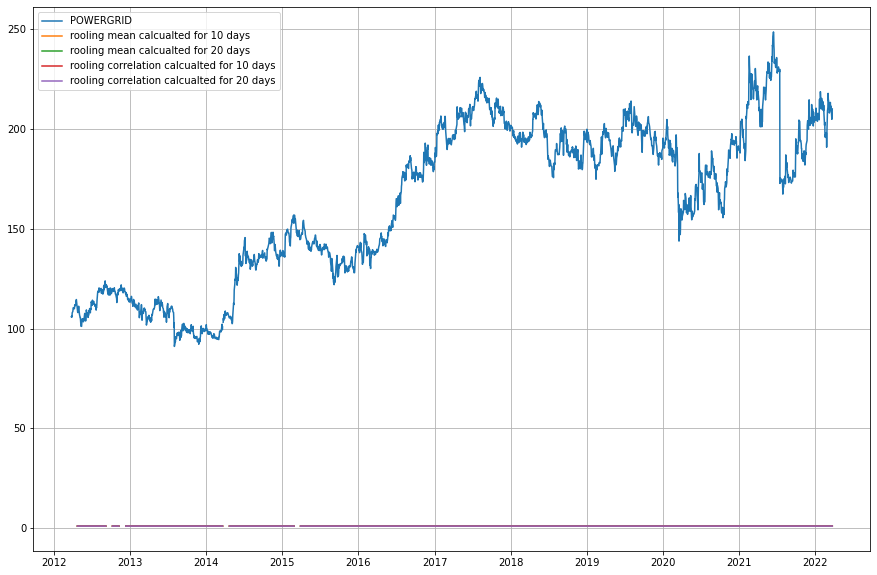

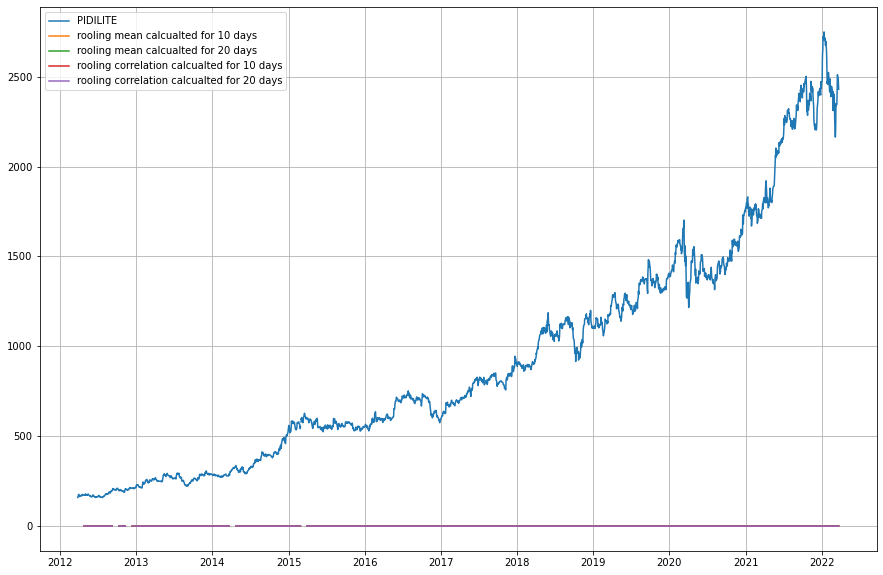

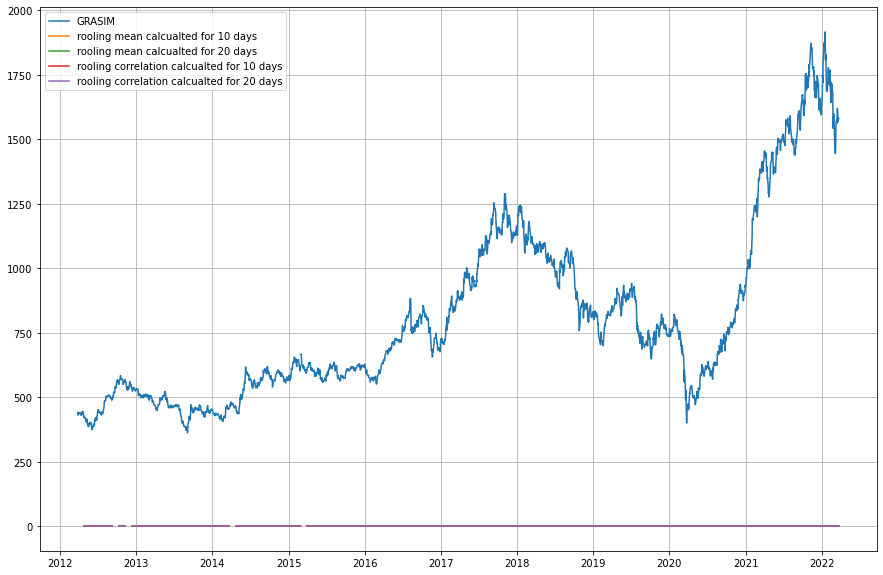

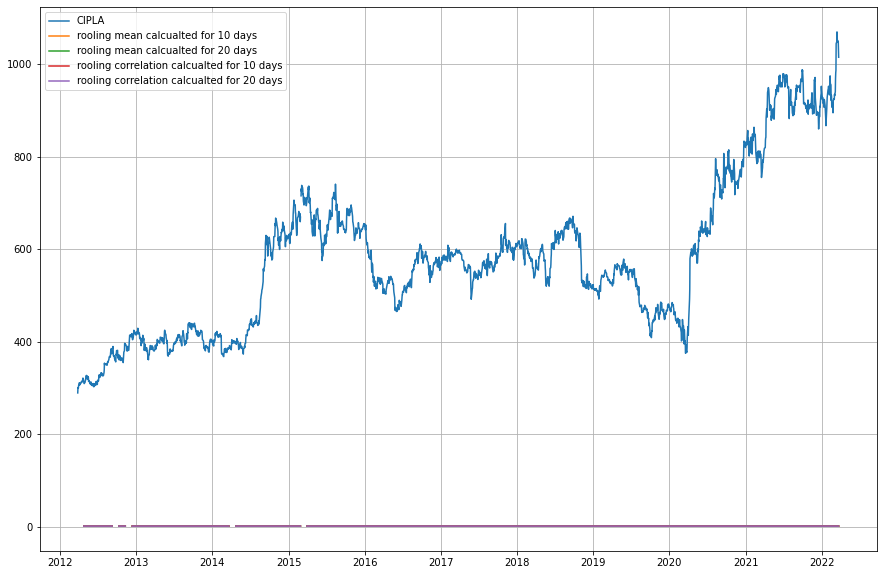

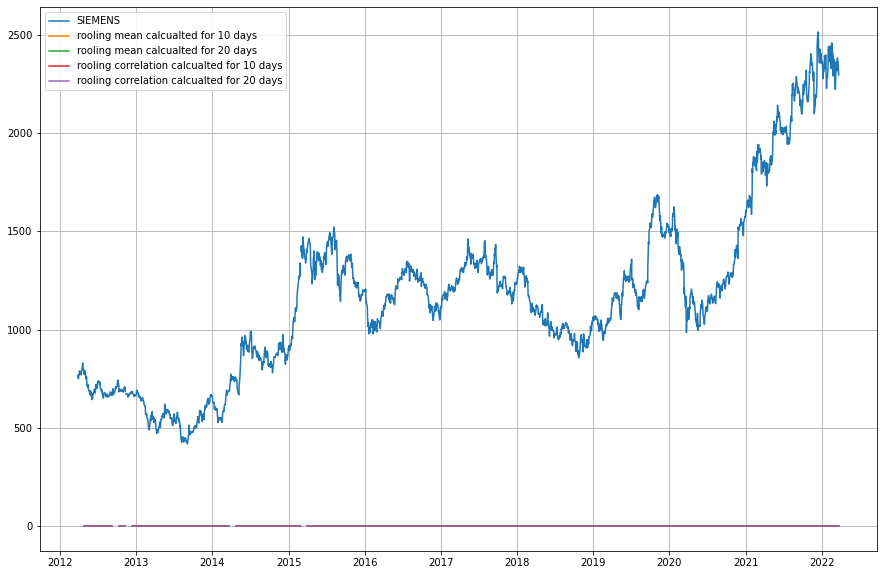

In [119]:
MA_10 = []
MA_10 = pd.DataFrame(MA)
MA_20 = []
MA_20 = pd.DataFrame(MA)
RC_10 = []
RC_10 = pd.DataFrame(MA)
RC_20 = []
RC_20 = pd.DataFrame(MA)

for i in range(len(BSE1.columns)):
    MA_10[i] = BSE1[BSE1.columns[i]].rolling(10).mean()
    #print("Rolling Mean (10) for BSE scrap :" , BSE1.columns[i])
    #print(MA_10[i])
    MA_20[i] = BSE1[BSE1.columns[i]].rolling(20).mean()
    #print("Rolling Mean (20) for BSE scrap :" , BSE1.columns[i])
    #print(MA_20[i])
    RC_10[i] = BSE1[BSE1.columns[i]].rolling(10).corr()
    #print("Rolling Correlation (10) for BSE scrap :" , BSE1.columns[i])
    #print(RC_10[i])
    RC_20[i] = BSE1[BSE1.columns[i]].rolling(20).corr()
    #print("Rolling Correlation (20) for BSE scrap :" , BSE1.columns[i])
    #print(RC_20[i])
    plt.figure(figsize=(15,10))
    plt.grid(True)
    plt.plot(BSE1[BSE1.columns[i]] , label = BSE1.columns[i] )
    plt.plot(MA_10[i] , label = 'rooling mean calcualted for 10 days')
    plt.plot(MA_20[i] , label= 'rooling mean calcualted for 20 days')
    plt.plot(RC_10[i] , label= 'rooling correlation calcualted for 10 days')
    plt.plot(RC_10[i] , label= 'rooling correlation calcualted for 20 days')
    plt.legend(loc=2)
    plt.show()
    



In [ ]:
MA = []
MA = pd.DataFrame(MA)

for i in range(len(BSE1.columns)):
    MA[i] = BSE1[BSE1.columns[i]].rolling(20).mean()
    print("Rolling Mean (20) for BSE scrap :" , BSE1.columns[i])
    print(MA[i])
    MA[i].iplot()

In [ ]:
RC = []
RC = pd.DataFrame(RC)

for i in range(len(BSE1.columns)):
    RC[i] = BSE1[BSE1.columns[i]].rolling(10).corr()
    print("Rolling Correlation (10) for BSE scrap :" , BSE1.columns[i])
    print(RC[i])
    RC[i].iplot()

In [ ]:
RC = []
RC = pd.DataFrame(RC)

for i in range(len(BSE1.columns)):
    RC[i] = BSE1[BSE1.columns[i]].rolling(20).corr()
    print("Rolling Correlation (20) for BSE scrap :" , BSE1.columns[i])
    print(RC[i])
    BSE1[BSE1.columns[i]].iplot()
    RC[i].iplot()